# Convolutional Neural Networks (CNNs)

### HW2 @ DL Course, Dr. Soleymani

*Full Name:* Payam Taebi

*SID:* 400104867

In this homework, you will work with [Google colab](https://colab.research.google.com/). Google colab allows you to run a jupyter notebook on Google servers using a GPU/TPU. To enable GPU support, make sure to press `Runtime -> Change Runtime Type -> GPU`.

## Task: Cats vs Dogs

To learn about CNNs we will be working on a problem of great importance in computer vision, **classifying images of cats and dogs** :)

The problem is so important that there's even an easter egg in colab: go to `Tools -> Settings -> Miscellaneous and enable 'Kitty mode' and 'Corgi mode'` to get more cats and dogs to classify when you're tired of coding :)

### Getting the data

To get started with the classification, we first need to download and unpack the dataset (note that in jupyter notebooks commands starting with `!` are executed in bash, not in python):

In [1]:
! wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O ./cats_and_dogs_filtered.zip

--2024-04-02 01:12:01--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.195.207, 172.253.117.207, 142.250.99.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.195.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: './cats_and_dogs_filtered.zip'

./cats_and_dogs_fil 100%[===================>]  65.43M  58.7MB/s    in 1.1s    

2024-04-02 01:12:03 (58.7 MB/s) - './cats_and_dogs_filtered.zip' saved [68606236/68606236]



In [2]:
! unzip -q cats_and_dogs_filtered.zip

### Dataset Organization
Our dataset contains two directories, `train` and `validation`, both containing two directories with images: `cats` and `dogs`. In `train` we have 1000 images of cats and 1000 images of dogs. For `validation`, we have 500 images of each class. Our goal is to implement and train a CNN to classify these images, i.e. given an image from this dataset, tell if it contains a *cat* or a *dog*.

```bash
├── dir.txt
├── train
│   ├── cats
│   │   ├── cat.0.jpg
│   │   ├── cat....jpg
│   │   ├── cat.999.jpg
│   └── dogs
│       ├── dog.0.jpg
│       ├── dog....jpg
│       ├── dog.999.jpg
├── validation
│   ├── cats
│   │   ├── cat.2000.jpg
│   │   ├── cat....jpg
│   │   └── cat.2499.jpg
│   └── dogs
│       ├── dog.2000.jpg
│       ├── dog....jpg
│       └── dog.2499.jpg
└── vectorize.py

6 directories, 3002 files
```

### Loading the data
 Now that we have the data on our disk, we need to load it so that we can use it to train our model. In Pytorch, we use `Dataset` class, documentation for which can be found [here](https://pytorch.org/docs/stable/data.html).

 Torchvision is a Pytorch library with many commonly used tools in computer vision. In the case of computer vision, the datasets with the folder structure `label_name/image_file` are very common, and to process those there's already an implemented class `torchvision.datasets.ImageFolder` (documented [here](https://pytorch.org/vision/0.8/datasets.html)).

 Another thing we need from Torchvision library is [transforms](https://pytorch.org/docs/stable/torchvision/transforms.html). In computer vision, we very often want to transform the images in certain ways. The most common is **normalization**. Others include *flipping*, changing *saturation*, *hue*, *contrast*, *rotation*, and *blurring*.

 Below, we create training, validation and test sets. We use a few transforms for **augmentation** on the training set, but we don't use anything but **resize** and **normalization** for validation and test.

In [3]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image
from torch.utils.data import DataLoader

# These numbers are mean and std values for channels of natural images.
normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

# Inverse transformation which is needed for plotting.
inv_normalize = transforms.Normalize(
   mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
   std=[1/0.229, 1/0.224, 1/0.225]
)

train_transforms = transforms.Compose([
                                    transforms.Resize((256, 256)),
                                    transforms.RandomHorizontalFlip(),
                                    transforms.ColorJitter(hue=.1, saturation=.1, contrast=.1),
                                    transforms.RandomRotation(20, interpolation=Image.Resampling.BILINEAR),
                                    transforms.GaussianBlur(7, sigma=(0.1, 1.0)),
                                    transforms.ToTensor(), # This is necessary to convert PIL to torch Tensor
                                    normalize,
                                ])

validation_transforms = transforms.Compose([
                                    transforms.Resize((256, 256)),
                                    transforms.ToTensor(),
                                    normalize,
                                ])

train_dataset = torchvision.datasets.ImageFolder('./cats_and_dogs_filtered/train', transform=train_transforms)
test_dataset = torchvision.datasets.ImageFolder('./cats_and_dogs_filtered/validation', transform=validation_transforms)

validation_dataset, test_dataset = torch.utils.data.random_split(test_dataset, [500, 500], generator=torch.Generator().manual_seed(42))

### Dataset Inspection
Let's see what one of the images in the dataset looks like (you can run this cell multiple times to see the effects of different augmentations):

torch.Size([3, 256, 256])


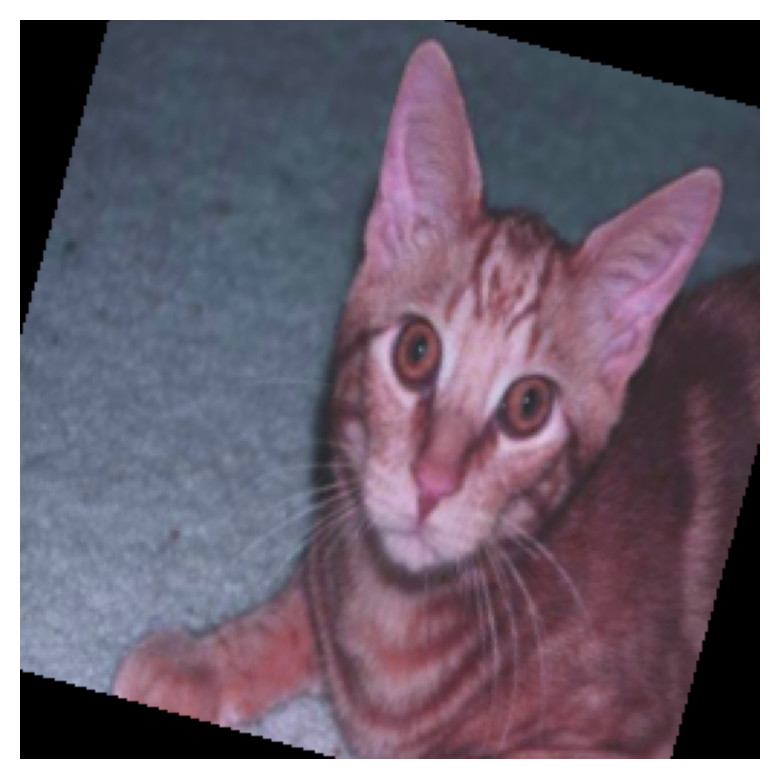

In [4]:
from matplotlib import pyplot as plt
plt.rcParams['figure.dpi'] = 200 # change dpi to make plots bigger

def show_normalized_image(img, title=None):
    plt.imshow(inv_normalize(img).detach().cpu().permute(1, 2, 0))
    plt.title(title)
    plt.axis('off')

print(train_dataset[10][0].shape)
show_normalized_image(train_dataset[10][0])

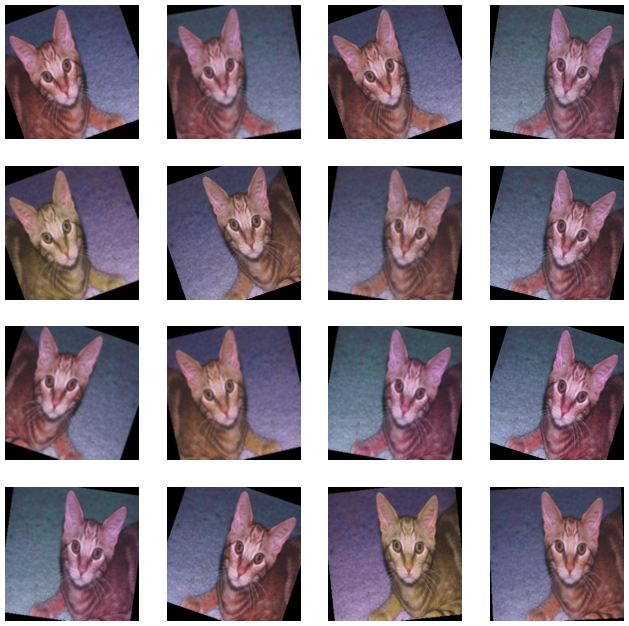

In [5]:
# checking the augmentation
plt.rcParams['figure.dpi'] = 50
plt.figure(figsize=(16,16))
for i in range(16):
    plt.subplot(4, 4, i+1)
    show_normalized_image(train_dataset[10][0])
plt.show()

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

### Creating the model

Now is the time to create a model.

All models in Pytorch are subclassing `torch.nn.Module`. We have to implement `__init__` and `forward` methods.

Below we provide a simple model skeleton, which you need to expand. The places to put your code are marked with `TODO`. Here, we ask you to implement a CNN containing the following elements:

* Convolutional layers (at least two)
* Pooling layers
* Non-linearity
* Residual connections similar to that of **ResNet**
* fully connected layer(s)

Note that you cannot use Batch Normalization layers in this step.

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)

        # Pooling layer
        self.pool = nn.AvgPool2d(kernel_size=2, stride=2)

        # Shortcut connection
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, bias=False),
                nn.AvgPool2d(kernel_size=2, stride=2)
            )



    def forward(self, x):
        out = F.relu(self.conv1(x))
        out = self.conv2(out)
        out += self.shortcut(x)
        out = F.relu(out)
        out = self.pool(out)
        return out

class CNN_cat_dog(nn.Module):
    def __init__(self, num_classes=2):
        super(CNN_cat_dog, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=7, stride=1, padding=3)
        self.residual_block1 = ResidualBlock(in_channels=16, out_channels=32, stride=2)
        self.residual_block2 = ResidualBlock(in_channels=32, out_channels=64, stride=2)
        #self.residual_block3 = ResidualBlock(in_channels=64, out_channels=128, stride=2)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)

        self.fc1 = nn.Linear(8 * 8 * 64, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = F.relu(self.conv1(x)) #256 256 16
        x = self.residual_block1(x) #64 64 32
        x = self.residual_block2(x) #16 16 64
        #x = self.residual_block3(x)
        x = self.pool(x) #8 8 64

        x = x.view(-1, 8 * 8 * 64)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)

        return x

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNN_cat_dog()
model.to(device)

CNN_cat_dog(
  (conv1): Conv2d(3, 16, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
  (residual_block1): ResidualBlock(
    (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (pool): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (shortcut): Sequential(
      (0): Conv2d(16, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): AvgPool2d(kernel_size=2, stride=2, padding=0)
    )
  )
  (residual_block2): ResidualBlock(
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (pool): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (shortcut): Sequential(
      (0): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): AvgPool2d(kernel_size=2, stride=2, padding=0)
    )
  )
  (pool): MaxPool2d(ker

In [9]:
!pip install torchsummary

In [10]:
from torchsummary import summary

summary(model, input_size=(3, 256, 256))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 256, 256]           2,368
            Conv2d-2         [-1, 32, 128, 128]           4,608
            Conv2d-3         [-1, 32, 128, 128]           9,216
            Conv2d-4         [-1, 32, 256, 256]             512
         AvgPool2d-5         [-1, 32, 128, 128]               0
         AvgPool2d-6           [-1, 32, 64, 64]               0
     ResidualBlock-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 64, 32, 32]          18,432
            Conv2d-9           [-1, 64, 32, 32]          36,864
           Conv2d-10           [-1, 64, 64, 64]           2,048
        AvgPool2d-11           [-1, 64, 32, 32]               0
        AvgPool2d-12           [-1, 64, 16, 16]               0
    ResidualBlock-13           [-1, 64, 16, 16]               0
        MaxPool2d-14             [-1, 6

### Training the model

Now we train the model on the dataset. Again, we're providing you with the skeleton with some parts marked as `TODO` to be filled by you.

In [11]:
from tqdm.notebook import tqdm
import torch.optim as optim

def get_loss_and_correct(model, batch, criterion, device):
    inputs, labels = batch
    inputs, labels = inputs.to(device), labels.to(device)
    outputs = model(inputs)
    loss = criterion(outputs, labels)
    _, predicted = torch.max(outputs, 1)
    correct = (predicted == labels).sum().item()
    return loss, correct

def step(loss, optimizer):
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()


In [12]:
def train_model(model, criterion, optimizer, scheduler, device='cuda', num_epochs=1,batch_size = 32 ,num_worker =2):

    train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_worker)
    validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size, num_workers=num_worker)


    if torch.cuda.is_available():
        model = model.cuda()
        criterion = criterion.cuda()
        device = torch.device("cuda:0")
    else:
        device = torch.device("cpu")

    model.to(device)

    model.train()

    train_losses = []
    train_accuracies = []
    validation_losses = []
    validation_accuracies = []

    pbar = tqdm(range(num_epochs))

    for i in pbar:
        total_train_loss = 0.0
        total_train_correct = 0.0
        total_validation_loss = 0.0
        total_validation_correct = 0.0

        model.train()

        for batch in tqdm(train_dataloader, leave=False):
            loss, correct = get_loss_and_correct(model, batch, criterion, device)
            step(loss, optimizer)

            total_train_loss += loss.item()
            total_train_correct += correct

        mean_train_loss = total_train_loss / len(train_dataloader.dataset)
        train_accuracy = total_train_correct / len(train_dataloader.dataset)

        with torch.no_grad():
            model.eval()
            for batch in validation_dataloader:
                loss, correct = get_loss_and_correct(model, batch, criterion, device)

                total_validation_loss += loss.item()
                total_validation_correct += correct

        mean_validation_loss = total_validation_loss / len(validation_dataloader.dataset)
        validation_accuracy = total_validation_correct / len(validation_dataloader.dataset)

        scheduler.step()  # Update learning rate scheduler

        train_losses.append(mean_train_loss)
        validation_losses.append(mean_validation_loss)
        train_accuracies.append(train_accuracy)
        validation_accuracies.append(validation_accuracy)

        pbar.set_postfix({'train_loss': mean_train_loss, 'validation_loss': mean_validation_loss, 'train_accuracy': train_accuracy, 'validation_accuracy': validation_accuracy})

    return train_losses, validation_losses, train_accuracies, validation_accuracies


Now that the model is trained, we want to visualize the training and validation losses and accuracies:

In [13]:
import matplotlib.pyplot as plt

def plot_losses_and_accuracies(train_losses, validation_losses, train_accuracies, validation_accuracies):
    plt.figure(dpi=200, figsize=(10, 5))

    plt.subplot(121)
    plt.plot(train_losses, label='train')
    plt.plot(validation_losses, label='validation')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title('Losses')
    plt.legend()

    plt.subplot(122)
    plt.plot(train_accuracies, label='train')
    plt.plot(validation_accuracies, label='validation')
    plt.legend()
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.ylim(0, 1)
    plt.title('Accuracies')

    plt.tight_layout()
    plt.show()


In [14]:
def train_and_plot(model, criterion, optimizer, scheduler, device='cuda', num_epochs=50 ,batch_size = 32 ,num_worker =2):
    train_losses, validation_losses, train_accuracies, validation_accuracies = train_model(model, criterion, optimizer, scheduler, device, num_epochs,batch_size ,num_worker)

    plot_losses_and_accuracies(train_losses, validation_losses, train_accuracies, validation_accuracies)

    return


#Train model:

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

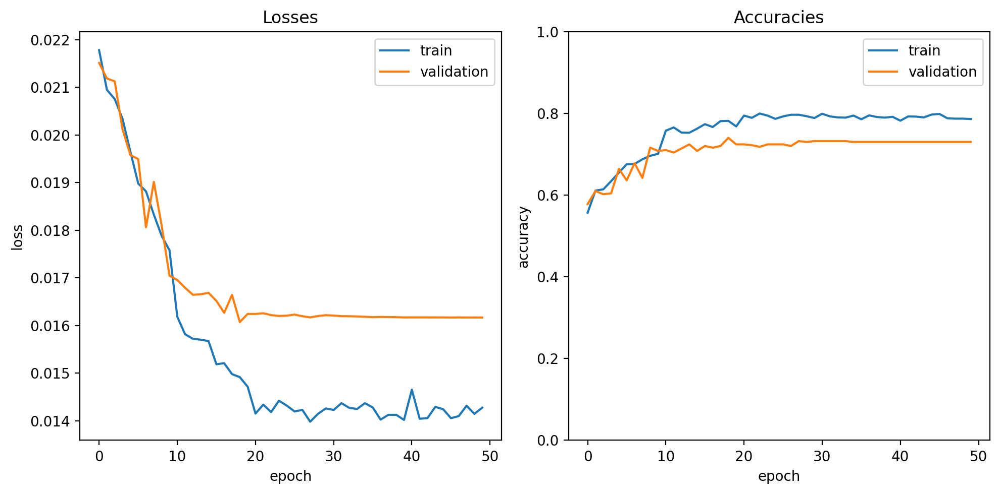

In [15]:
model = CNN_cat_dog()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

train_and_plot(model, criterion, optimizer, scheduler)

Now, change your model to achieve at least 75% accuracy on validation set. Add Dropout and Batch Norm layers where needed. You can change the model you've implemented (including the model depth, activation functions, etc.), the optimizer (including the regularizer terms), and the augmentations.

#### Question
Looking at the loss and accuracy plots, can you see if your model overfits the trainig set? Why?


When analyzing the loss and accuracy plots, it's evident that our model is encountering overfitting. Despite having only 1 million parameters, the model's performance on the training data continues to improve, with the loss decreasing consistently. However, this improvement isn't mirrored in the validation data, where the loss either stagnates or even increases over time.

Overfitting occurs when the model fits too closely to the training data, capturing noise and irrelevant patterns instead of learning generalizable features. The absence of batch normalization in our model may exacerbate this issue, as batch normalization helps stabilize and accelerate training, preventing the model from becoming too sensitive to specific batches of data.

To address overfitting, we may need to explore techniques such as regularization, dropout, or increasing the diversity of our training data. These methods can help the model generalize better to unseen data and mitigate the effects of overfitting, ultimately improving its performance on validation and test sets.


In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNN_cat_dog(nn.Module):
    def __init__(self):
        super(CNN_cat_dog, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3)
        self.bn1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout(p=0.2)

        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3)
        self.bn2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout2 = nn.Dropout(p=0.2)

        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout3 = nn.Dropout(p=0.2)

        self.conv4 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3)
        self.bn4 = nn.BatchNorm2d(256)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout4 = nn.Dropout(p=0.2)

        self.fc1 = nn.Linear(9216, 512)
        self.bn5 = nn.BatchNorm1d(512)
        self.dropout5 = nn.Dropout(p=0.2)

        self.fc2 = nn.Linear(512, 2)

    def forward(self, x):
        x = F.interpolate(x, size=(128, 128), mode='bilinear', align_corners=False)  # Resize image to 128x128
        x = self.conv1(x)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.pool1(x)
        x = self.dropout1(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.pool2(x)
        x = self.dropout2(x)

        x = self.conv3(x)
        x = self.bn3(x)
        x = F.relu(x)
        x = self.pool3(x)
        x = self.dropout3(x)

        x = self.conv4(x)
        x = self.bn4(x)
        x = F.relu(x)
        x = self.pool4(x)
        x = self.dropout4(x)

        x = x.view(-1, 256 * 6 * 6)

        x = self.fc1(x)
        x = self.bn5(x)
        x = F.relu(x)
        x = self.dropout5(x)

        x = self.fc2(x)

        return x


model = CNN_cat_dog()
model.to(device)
summary(model, input_size=(3, 256, 256))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 126, 126]             896
       BatchNorm2d-2         [-1, 32, 126, 126]              64
         MaxPool2d-3           [-1, 32, 63, 63]               0
           Dropout-4           [-1, 32, 63, 63]               0
            Conv2d-5           [-1, 64, 61, 61]          18,496
       BatchNorm2d-6           [-1, 64, 61, 61]             128
         MaxPool2d-7           [-1, 64, 30, 30]               0
           Dropout-8           [-1, 64, 30, 30]               0
            Conv2d-9          [-1, 128, 28, 28]          73,856
      BatchNorm2d-10          [-1, 128, 28, 28]             256
        MaxPool2d-11          [-1, 128, 14, 14]               0
          Dropout-12          [-1, 128, 14, 14]               0
           Conv2d-13          [-1, 256, 12, 12]         295,168
      BatchNorm2d-14          [-1, 256,

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

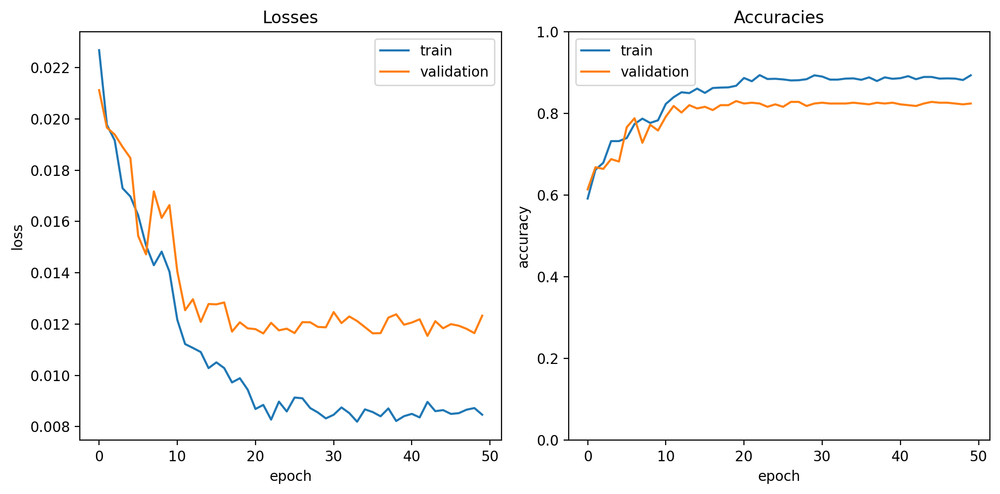

In [17]:
model = CNN_cat_dog()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

train_and_plot(model, criterion, optimizer, scheduler)

### Testing the model

Now, use the `test_dataset` to get the final accuracy of your model. Visualize some correctly and incorrectly classified examples.

In [18]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

def evaluate_model(model):
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)
    model.eval()  # Set the model to evaluation mode
    y_true = []
    y_pred = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())

    # Calculate accuracy
    correct = sum(int(y_pred[i] == y_true[i]) for i in range(len(y_true)))
    total = len(y_true)
    accuracy = correct / total * 100
    print('Accuracy of the network on the test images: {:.2f}%'.format(accuracy))

    # Calculate and print classification report
    report = classification_report(y_true, y_pred, target_names=['Cat', 'Dog'])
    print(report)

    # Plot confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Cat', 'Dog'], yticklabels=['Cat', 'Dog'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()





def visualize_examples(model, num_examples=10):
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)
    model.eval()
    correct_examples = []
    incorrect_examples = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            for i in range(len(predicted)):
                if predicted[i] == labels[i]:
                    correct_examples.append((images[i], labels[i].item(), predicted[i].item()))
                else:
                    incorrect_examples.append((images[i], labels[i].item(), predicted[i].item()))

    print("Correctly Classified Examples:")
    plt.figure(figsize=(20, 12))
    for i in range(min(num_examples, len(correct_examples))):
        image, true_label, predicted_label = correct_examples[i]
        image = image.cpu().numpy().transpose((1, 2, 0))  # Convert from tensor to numpy array and rearrange dimensions
        plt.subplot(1, num_examples, i + 1)
        plt.imshow(image)
        plt.title(f'T: {true_label}, P: {predicted_label}')
        plt.axis('off')
        
    plt.show()

    plt.figure(figsize=(20, 12))
    print("\nIncorrectly Classified Examples:")
    for i in range(min(num_examples, len(incorrect_examples))):
        image, true_label, predicted_label = incorrect_examples[i]
        image = image.cpu().numpy().transpose((1, 2, 0))  # Convert from tensor to numpy array and rearrange dimensions
        plt.subplot(1, num_examples, i + 1)
        plt.imshow(image)
        plt.title(f'T: {true_label}, P: {predicted_label}')
        plt.axis('off')

    plt.show()
    return


Accuracy of the network on the test images: 81.80%
              precision    recall  f1-score   support

         Cat       0.78      0.88      0.83       247
         Dog       0.87      0.75      0.81       253

    accuracy                           0.82       500
   macro avg       0.82      0.82      0.82       500
weighted avg       0.82      0.82      0.82       500



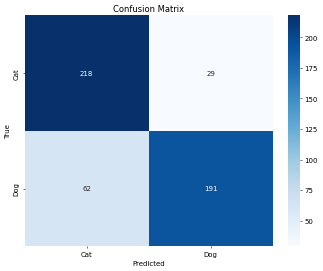

Correctly Classified Examples:


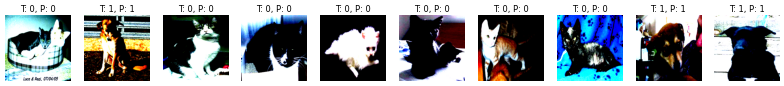


Incorrectly Classified Examples:


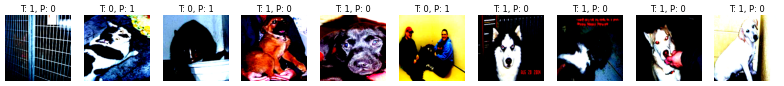

In [19]:
evaluate_model(model)
visualize_examples(model)

# Exploring the feature space
# (voluntary)

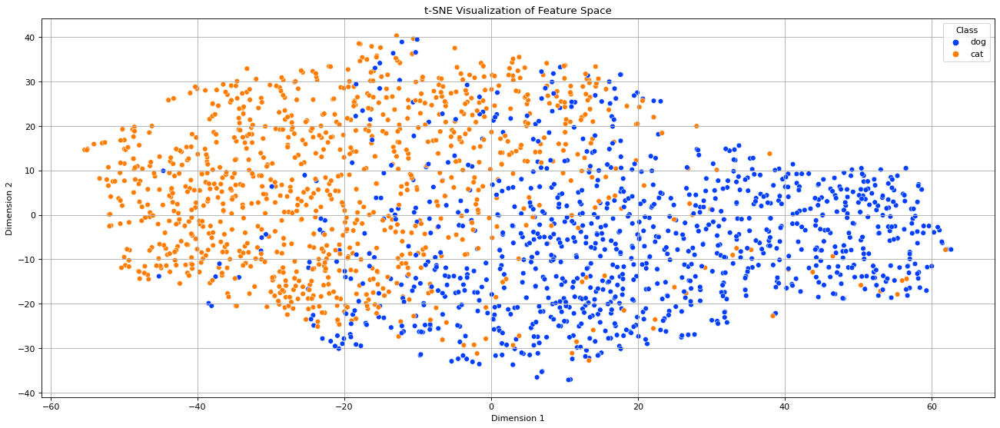

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from sklearn.manifold import TSNE
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data.dataset import ConcatDataset

classes = ["cat","dog"]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

loader = DataLoader(ConcatDataset([test_dataset, train_dataset,validation_dataset]), batch_size=200, shuffle=False)

outputs = []
labels = []
inputs = []

with torch.no_grad():
    for data in loader:
        batch_inputs, batch_labels = data[0].to(device), data[1].to(device)
        #print(batch_inputs.shape
        features = F.interpolate(batch_inputs, size=(128, 128), mode='bilinear', align_corners=False) 
        # Forward pass through the model
        features = model.conv1(features)
        features = model.bn1(features)
        features = F.relu(features)
        features = model.pool1(features)  # Applying max pooling
        features = model.dropout1(features)

        features = model.conv2(features)
        features = model.bn2(features)
        features = F.relu(features)
        features = model.pool2(features)
        features = model.dropout2(features)

        features = model.conv3(features)
        features = model.bn3(features)
        features = F.relu(features)
        features = model.pool3(features)
        features = model.dropout3(features)

        features = model.conv4(features)
        features = model.bn4(features)
        features = F.relu(features)
        features = model.pool4(features)
        features = model.dropout4(features)

        features = features.view(features.size(0), -1)

        features = model.fc1(features)
        features = model.bn5(features)
        features = F.relu(features)
        features = model.dropout5(features)

        # Appending the features, labels, and inputs
        outputs.append(features)
        labels.append(batch_labels)
        inputs.append(batch_inputs)

outputs = torch.cat(outputs)
labels = torch.cat(labels)
inputs = torch.cat(inputs)

# Taking a random subset of the data for visualization
indices = torch.randperm(outputs.size(0))[:2000]

X = outputs[indices].cpu().numpy()
y = labels[indices].cpu().numpy()

# Reduce dimension using t-SNE
X_2d = TSNE(n_components=2, random_state=42).fit_transform(X)

data = pd.DataFrame({
    'x': X_2d[:, 0],
    'y': X_2d[:, 1],
    'label': [classes[t] for t in y],
})

# Plotting
plt.figure(figsize=(20, 8), dpi=80)
cmap = sns.color_palette("bright", len(classes)).as_hex()
sns.scatterplot(data=data, x='x', y='y', hue='label', palette=cmap)
plt.title('t-SNE Visualization of Feature Space')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.grid(True)
plt.legend(title='Class')
plt.show()


In [21]:
if torch.cuda.is_available():
        model = model.cuda()
        criterion = criterion.cuda()
        device = torch.device("cuda:0")
else:
        device = torch.device("cpu")

model.to(device)
print(device)

cuda:0


### Visualizing filters

In this part, we are going to visualize the output of one of the convolutional layers to see what features they focus on.

First, let's get some image.

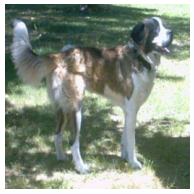

In [22]:
image = validation_dataset[10][0]
image = image.to(device)
show_normalized_image(image)

Now, we are going to *clip* our model at different points to get different intermediate representation.
* Clip your model at two or three different points and plot the filters output.

In order to clip the model, you can use `model.children()` method. For example, to get output only after the first 4 layers, you can do:

```
clipped = nn.Sequential(
    *list(model.children()[:2])
)
intermediate_output = clipped(input)
```



Intermediate Output Shape for Layer 1: torch.Size([1, 6, 254, 254])


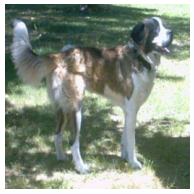

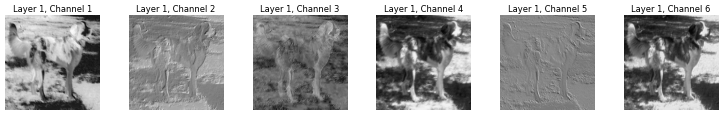

Intermediate Output Shape for Layer 2: torch.Size([1, 6, 254, 254])


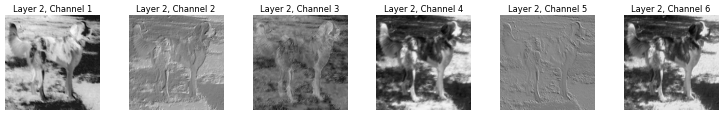

Intermediate Output Shape for Layer 3: torch.Size([1, 6, 127, 127])


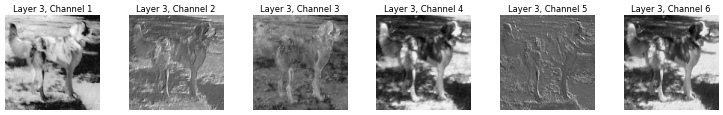

Intermediate Output Shape for Layer 4: torch.Size([1, 6, 127, 127])


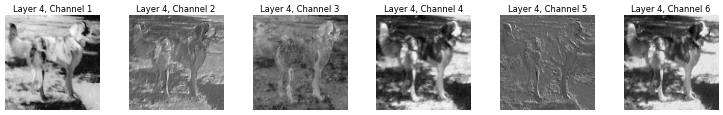

Intermediate Output Shape for Layer 5: torch.Size([1, 6, 125, 125])


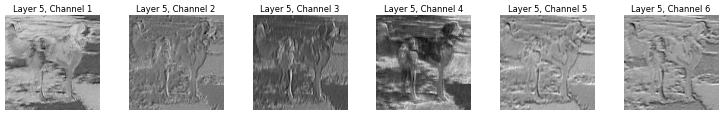

Intermediate Output Shape for Layer 6: torch.Size([1, 6, 125, 125])


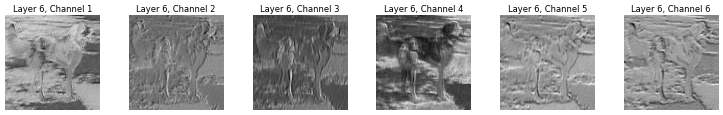

Intermediate Output Shape for Layer 7: torch.Size([1, 6, 62, 62])


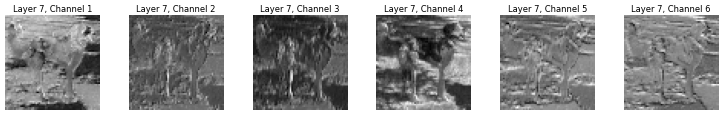

Intermediate Output Shape for Layer 8: torch.Size([1, 6, 62, 62])


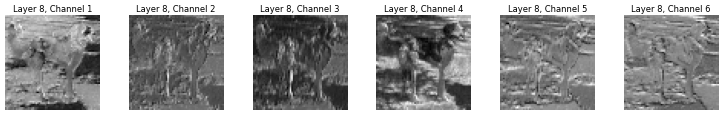

Intermediate Output Shape for Layer 9: torch.Size([1, 6, 60, 60])


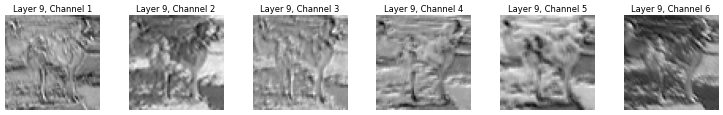

Intermediate Output Shape for Layer 10: torch.Size([1, 6, 60, 60])


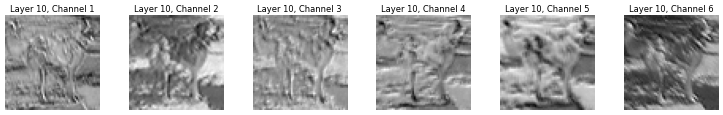

Intermediate Output Shape for Layer 11: torch.Size([1, 6, 30, 30])


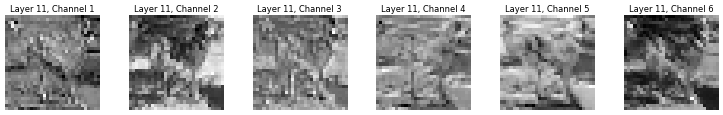

Intermediate Output Shape for Layer 12: torch.Size([1, 6, 30, 30])


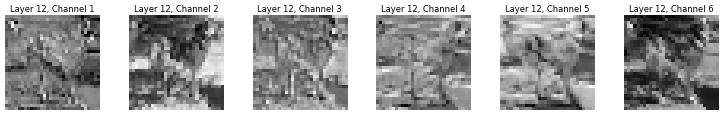

Intermediate Output Shape for Layer 13: torch.Size([1, 6, 28, 28])


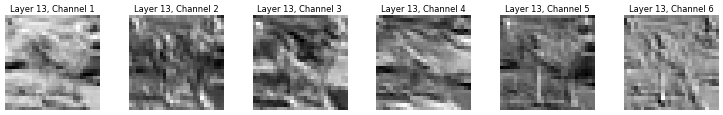

Intermediate Output Shape for Layer 14: torch.Size([1, 6, 28, 28])


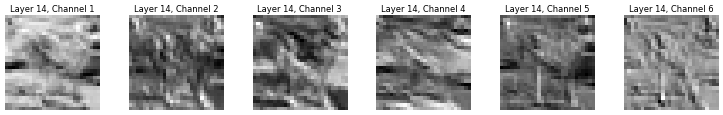

Intermediate Output Shape for Layer 15: torch.Size([1, 6, 14, 14])


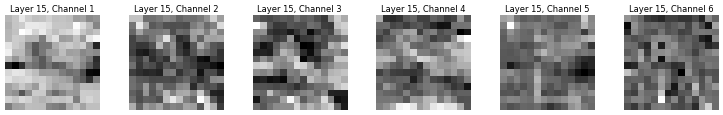

Intermediate Output Shape for Layer 16: torch.Size([1, 6, 14, 14])


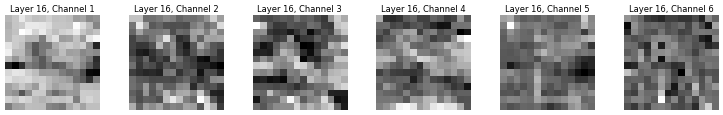

In [23]:
clipped_models = [nn.Sequential(*list(model.children())[:i+1]) for i in range(len(list(model.children())) - 4)]


show_normalized_image(image)

for i, clipped_model in enumerate(clipped_models):
    with torch.no_grad():
        intermediate_output = clipped_model(image.unsqueeze(0))
        intermediate_output = intermediate_output[:, :6]
        print(f"Intermediate Output Shape for Layer {i+1}: {intermediate_output.shape}")
        # Visualize
        fig, axes = plt.subplots(1, 6, figsize=(15, 5))
        fig.tight_layout()
        for j in range(6):
            axes[j].imshow(intermediate_output[0, j].cpu().numpy(), cmap='gray')
            axes[j].axis('off')
            axes[j].set_title(f'Layer {i+1}, Channel {j+1}')
        plt.show()


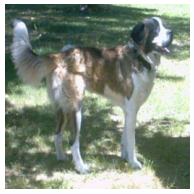

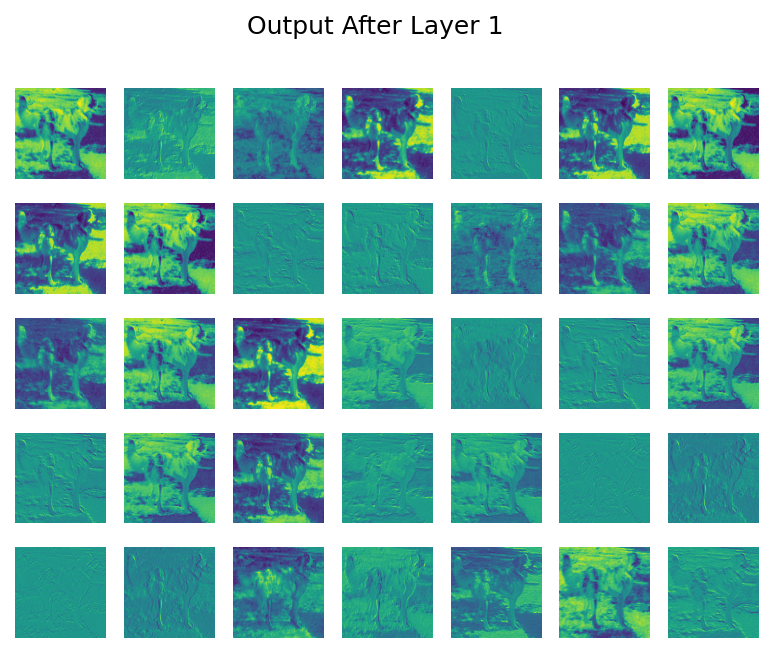

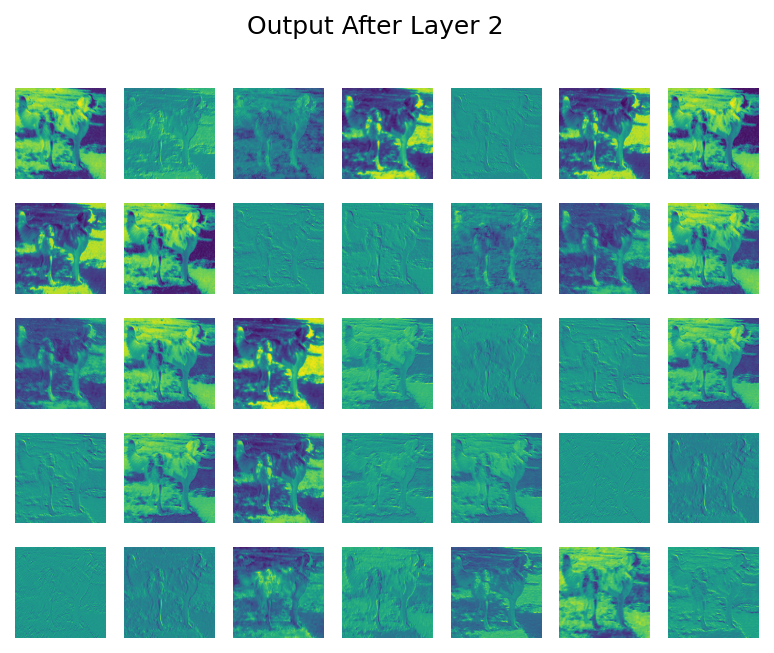

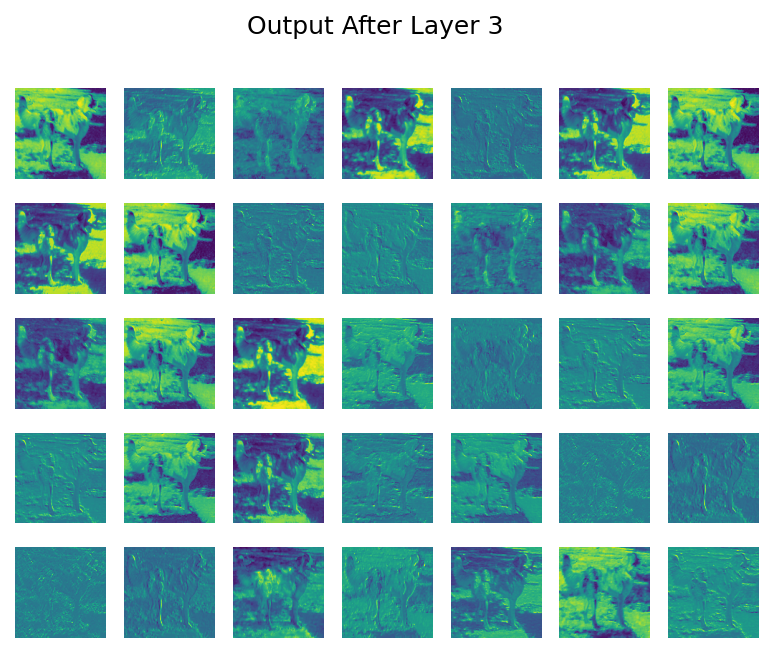

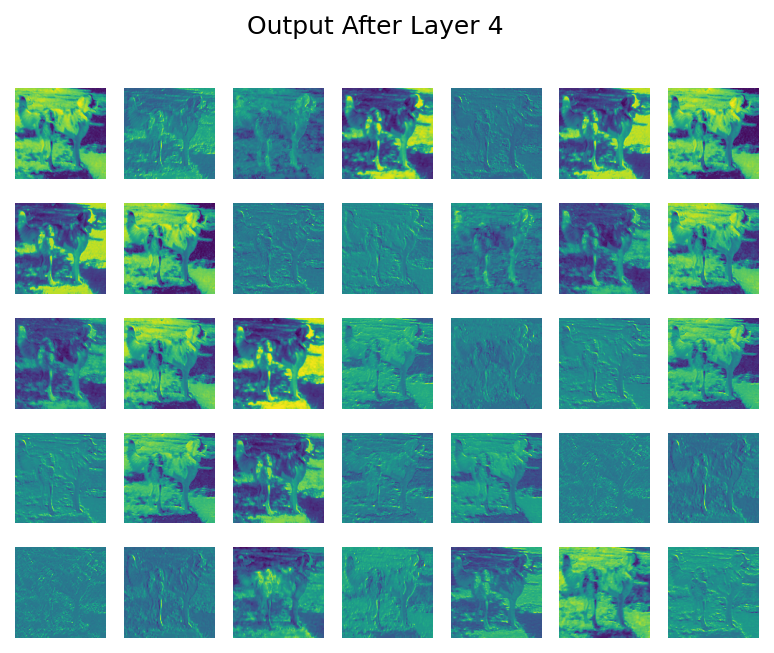

...

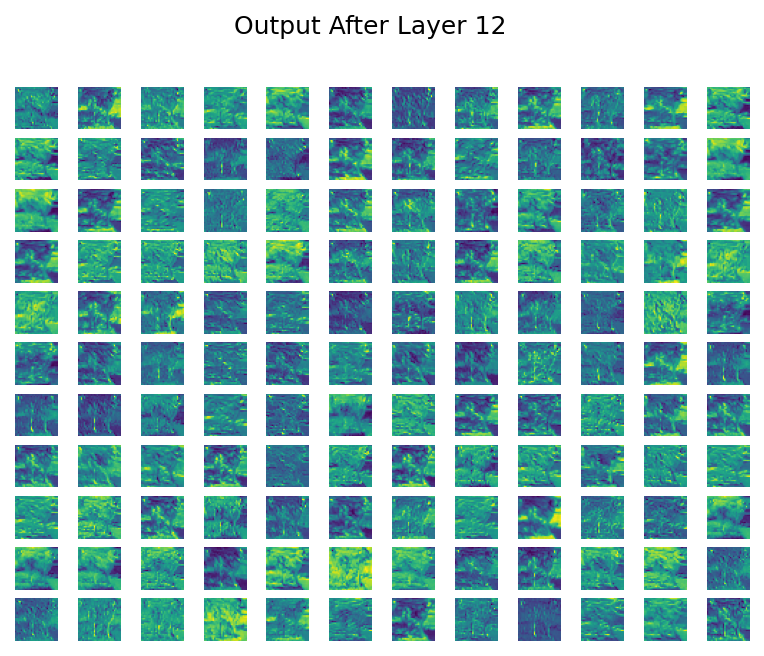

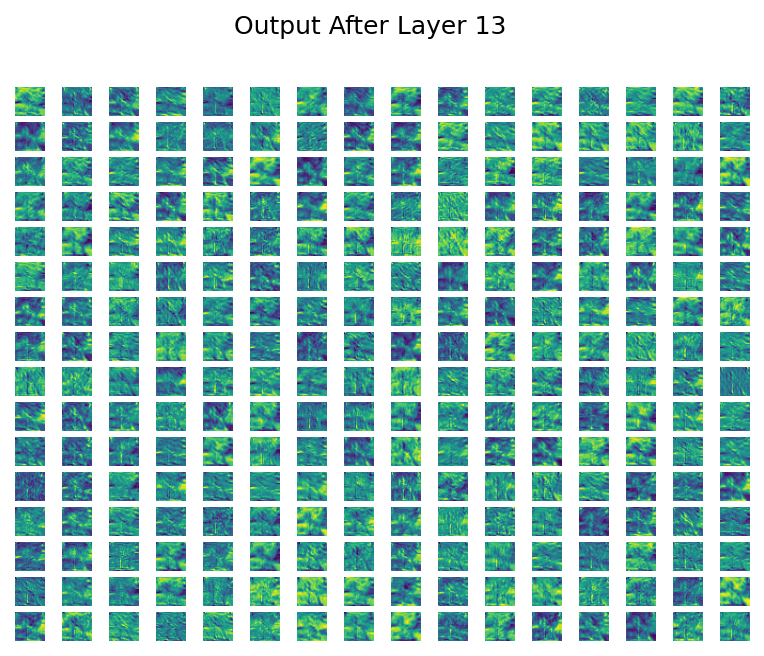

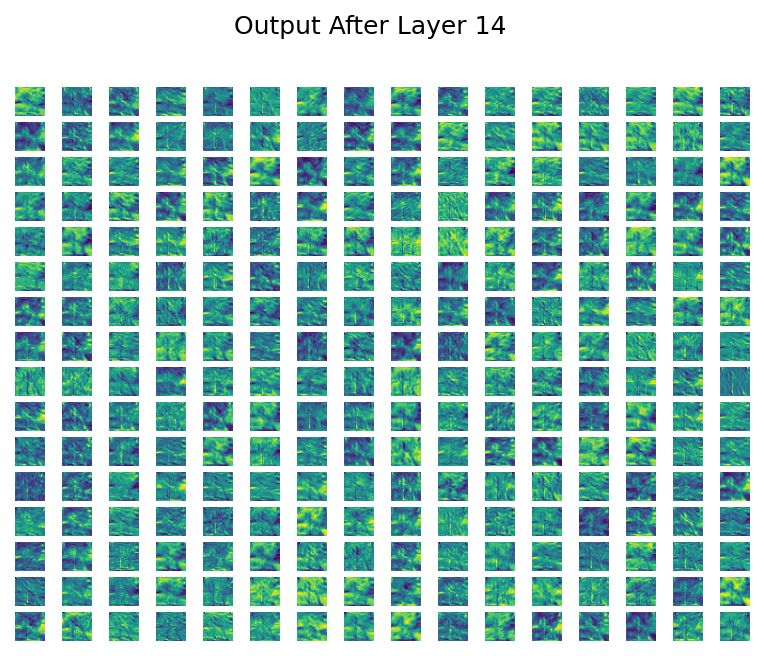

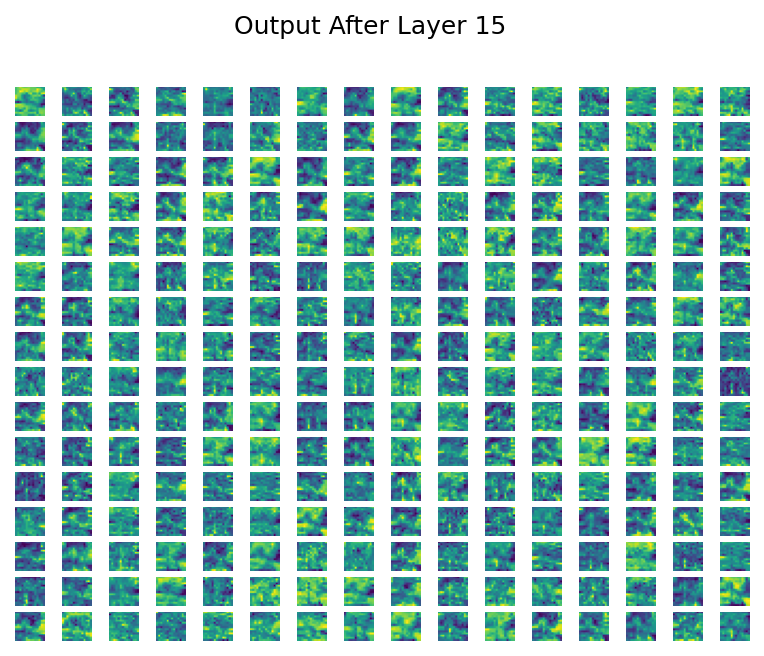

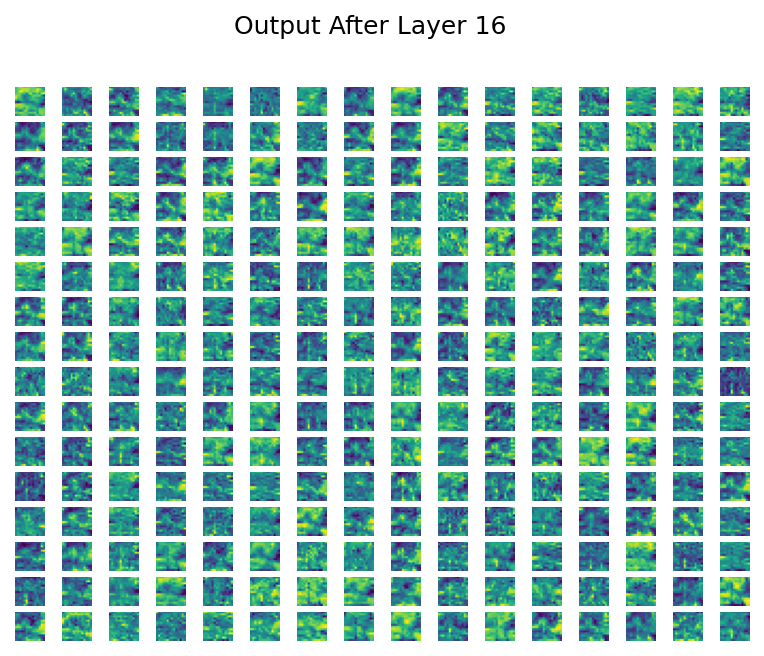

In [24]:
import math

def plot_intermediate_output(result, title=None):
    """ Plots the intermediate output of shape
      N_FILTERS x H x W
    """
    plt.rcParams['figure.dpi'] = 150
    n_filters = result.shape[1]
    N = int(math.sqrt(n_filters))
    M = (n_filters + N - 1) // N
    assert N * M >= n_filters

    fig, axs = plt.subplots(N, M)
    fig.suptitle(title)

    for i in range(N):
        for j in range(M):
            if i*N + j < n_filters:
                axs[i][j].imshow(result[0, i*N + j].cpu().detach())
                axs[i][j].axis('off')



image = validation_dataset[10][0]
show_normalized_image(image)


clipped_models = [nn.Sequential(*list(model.children())[:i+1]) for i in range(len(list(model.children())) - 4)]

for clipped_model in clipped_models:
    clipped_model = clipped_model.to(device)
    with torch.no_grad():
        intermediate_output = clipped_model(image.unsqueeze(0).to(device))
    plot_intermediate_output(intermediate_output, title=f'Output After Layer {len(clipped_model)}')



### Question
What can you say about those filters? What features are they focusing on?

# Analysis of CNN Filters

## First Layer Filters
The filters in the first layer appear to capture simple patterns and low-level features such as edges, gradients, and color contrasts. These filters seem to be responsible for detecting basic visual elements in the input images.

## Middle Layer Filters
As we move deeper into the network, the filters become more complex and start capturing higher-level features. They seem to focus on detecting textures, shapes, and parts of objects. Some filters appear to specialize in recognizing specific patterns or textures that are common in the dataset.

## Last Layer Filters
Towards the end of the network, the filters represent even more abstract and high-level features. They might be specialized in recognizing entire objects or object parts. The patterns detected by these filters are likely crucial for distinguishing between different classes in the dataset.

the filters in the CNN progressively learn to detect increasingly complex and abstract features as information flows through the layers. These features are essential for the network to make accurate predictions on the given task.
